In [2]:
import NewDataset,middle_fusion_,NewArchitectures
from NewDataset import Dataset
import os
import pandas as pd
import numpy as np
import rasterio as rs
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import importlib
import torch
import torch.nn as nn
%matplotlib inline
import rasterio
import ipywidgets

import cv2


/home/adrien/Documents/Internship 3A polytechnique/Forecasting-DL-sent2-time-series/.venv/lib/python3.12/site-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.6' (you have '2.0.5'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [20]:
import json

# Charger le fichier JSON
with open('path.json', 'r') as f:
    path = json.load(f)

with open('params.json', 'r') as f:
    params = json.load(f)


# test

In [21]:
# Define the path to the .tif file
tif_path = "Sorted_Sources/image_0/RGB.tif"
# Read the .tif image
with rasterio.open(tif_path) as src:
    image_data = src.read()  # Read all bands
    metadata = src.meta  # Get metadata

# Print metadata
print("Metadata:", metadata)

# Display the shape of the image data
print("Image shape:", image_data.shape)

Metadata: {'driver': 'GTiff', 'dtype': 'uint8', 'nodata': None, 'width': 363, 'height': 256, 'count': 3, 'crs': CRS.from_wkt('GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AXIS["Latitude",NORTH],AXIS["Longitude",EAST],AUTHORITY["EPSG","4326"]]'), 'transform': Affine(2.9541236798868783e-05, 0.0, 8.785682916641239,
       0.0, -2.0726649078289805e-05, 45.41780016838129)}
Image shape: (3, 256, 363)


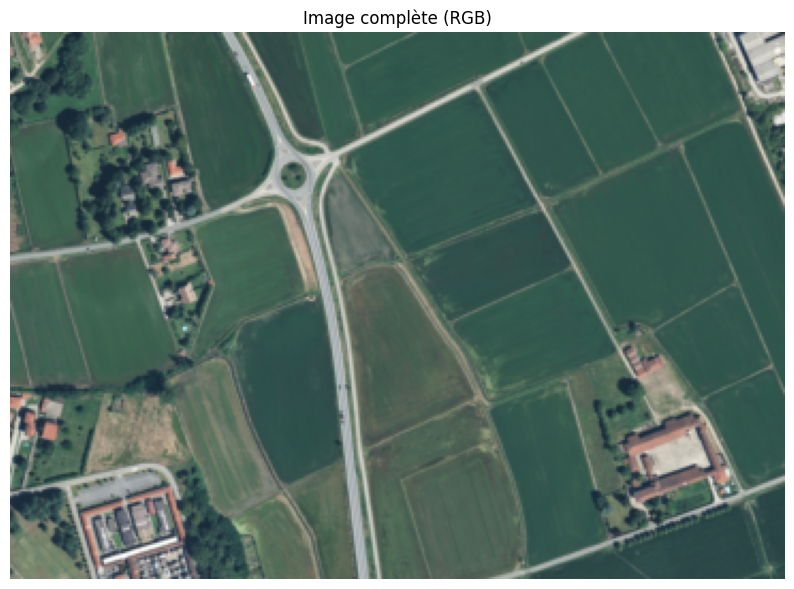

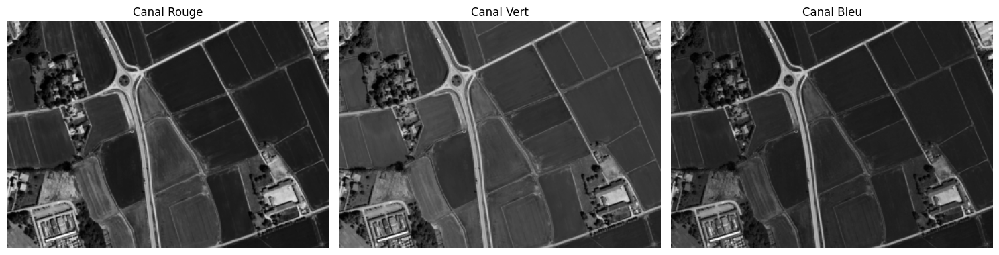

In [22]:
def plot_rgb(image):    
#    Afficher l'image complète (RGB)
    image_display = np.transpose(image, (1, 2, 0))  # Réorganiser pour (hauteur, largeur, canaux)

    plt.figure(figsize=(10, 8))
    if image_display.max() > 1.0:  # Normalisation si nécessaire
        plt.imshow(image_display / image_display.max())
    else:
        plt.imshow(image_display)
    plt.title("Image complète (RGB)")
    plt.axis('off')
    plt.show()

    # Afficher les canaux individuels (Rouge, Vert, Bleu)
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    channel_names = ['Rouge', 'Vert', 'Bleu']

    for i, (ax, name) in enumerate(zip(axes, channel_names)):
        ax.imshow(image[i], cmap='gray')  # Chaque canal individuellement
        ax.set_title(f'Canal {name}')
        ax.axis('off')

    plt.tight_layout()
    plt.show()

plot_rgb(image_data)

In [23]:
# Correcting the shape for display DEM
image_display = np.squeeze(image)  # Removes dimensions of size 1

plt.figure(figsize=(10, 8))
if image_display.max() > 1.0:  # Normalization if necessary
    plt.imshow(image_display / image_display.max(), cmap='gray')
else:
    plt.imshow(image_display, cmap='gray')

plt.title("Image DEM")
plt.colorbar(label="Altitude (unités normalisées)")  # Add a colorbar for elevation scale
plt.axis('off')
plt.show()

NameError: name 'image' is not defined

In [ ]:
model=NewArchitectures.NewArchitectures(params=params)

In [14]:
# Définir les chemins d'accès
root_directory = ""  # Dossier contenant vos images
csv_file_path = "Sources/List/train_set.txt"      # Fichier CSV listant vos noms de fichiers

# Instancier le dataset
dataset = Dataset.Dataset(root_dir=root_directory, csv_file=csv_file_path)

In [6]:
global_dataset = NewDataset.NewDatasetGlobal(
    root_dir='/mnt/hdd1/sen12tp-v1-train-part1',
    split='train', pca=False, trans=None
)

train sans tout les classes, à la main

In [22]:
# Paramètres d'entraînement
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_epochs = 10
batch_size = 8
learning_rate = 0.001

# Critère de perte L1
criterion = nn.L1Loss()

# Optimiseur Adam
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

In [ ]:
model=NewArchitectures.Unet(
    input_channels=3,    
    )

In [86]:
dataset=NewDataset.NewDataset(root_dir='/mnt/hdd1/sen12tp-v1-test/', split='test', pca=False, trans=None)
subset_size = int(len(dataset) * 0.1)
indices = torch.randperm(len(dataset))[:subset_size]
dataset = torch.utils.data.Subset(dataset, indices)
train_loader=DataLoader(dataset, batch_size=batch_size, shuffle=True)

In [ ]:
# Fetch a single batch of data from the train_loader
batch = next(iter(train_loader))
print(batch)

In [83]:
def train_model(model, train_loader, criterion, optimizer, num_epochs, device):
    model.train()
    for epoch in range(num_epochs):
        print(epoch)
        running_loss = 0.0
        for i, batch in enumerate(train_loader):
            print(i,len(batch))
            inputs, targets = batch
            # Déplacer les données vers le device (CPU/GPU)
            inputs = inputs.to(device)
            targets = targets.to(device)
            
            # Mise à zéro des gradients
            optimizer.zero_grad()
            
            # Forward pass
            outputs = model(inputs)
            
            # Calcul de la perte
            loss = criterion(outputs, targets)
            
            # Backward pass et optimisation
            loss.backward()
            optimizer.step()
            
            # Statistiques
            running_loss += loss.item()
            
            # Afficher la progression (tous les 100 lots)
            if (i + 1) % 100 == 0:
                print(f'Epoch [{epoch+1}/{num_epochs}], Batch [{i+1}/{len(train_loader)}], Loss: {running_loss/100:.4f}')
                running_loss = 0.0
        
        print(f'Epoch [{epoch+1}/{num_epochs}] terminée')



def evaluate_model(model, test_loader, criterion, device):
    model.eval()
    total_loss = 0.0
    with torch.no_grad():
        for inputs, targets in test_loader:
            inputs = inputs.to(device)
            targets = targets.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            total_loss += loss.item()
    
    avg_loss = total_loss / len(test_loader)
    print(f'Perte moyenne sur l\'ensemble de test: {avg_loss:.4f}')
    return avg_loss

# Fonction pour sauvegarder le modèle
def save_model(model, path='model.pth'):
    torch.save(model.state_dict(), path)
    print(f'Modèle sauvegardé à {path}')

# Pour charger le modèle ultérieurement
def load_model(model, path='model.pth'):
    model.load_state_dict(torch.load(path))
    print(f'Modèle chargé depuis {path}')
    return model

In [84]:
train_model(model, train_loader, criterion, optimizer, num_epochs, device)

0
0 3


ValueError: too many values to unpack (expected 2)

In [ ]:
import os
import rasterio
import numpy as np

# Chemin du dossier contenant les sous-dossiers
base_dir = "test"

# Parcourir les sous-dossiers
for folder in os.listdir(base_dir):
    folder_path = os.path.join(base_dir, folder)
    
    if os.path.isdir(folder_path):  # Vérifier que c'est bien un dossier
        # Chercher l'image Sentinel-2 (.tif) dans le dossier
        for file in os.listdir(folder_path):
            if file.endswith("_s2.tif"):  # Identifier le fichier Sentinel-2
                s2_path = os.path.join(folder_path, file)

                # Définir le chemin du fichier NDVI
                ndvi_filename = file.replace("_s2.tif", "_ndvi.tif")
                ndvi_path = os.path.join(folder_path, ndvi_filename)

                # Vérifier si le fichier NDVI existe déjà
                if os.path.exists(ndvi_path):
                    print(f"Le fichier NDVI existe déjà : {ndvi_path}")
                    continue  # Passer au suivant

                with rasterio.open(s2_path) as src:
                    red = src.read(4)  # Bande rouge
                    nir = src.read(8)  # Bande proche infrarouge

                    profile = src.profile  # Récupérer les métadonnées

                # Calculer le NDVI
                ndvi = (nir.astype(float) - red.astype(float)) / (nir + red)

                # Mise à jour des métadonnées pour l'image NDVI
                profile.update(
                    dtype=rasterio.float32,
                    count=1  # Une seule bande
                )

                # Sauvegarder le fichier NDVI
                with rasterio.open(ndvi_path, "w", **profile) as dst:
                    dst.write(ndvi.astype(rasterio.float32), 1)

                print(f"Fichier NDVI créé : {ndvi_path}")


In [ ]:
import os
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from rasterio.warp import reproject, Resampling

# Chemin du dossier contenant les images
base_dir = "Sorted_Sources"

# Compteur pour l'affichage
counter = 0

# Parcours des dossiers d'images
for image_folder in os.listdir(base_dir):
    image_path = os.path.join(base_dir, image_folder)

    # Vérifier que c'est bien un dossier
    if os.path.isdir(image_path):
        rgb_file = os.path.join(image_path, "RGB.tif")
        vnir_file = os.path.join(image_path, "VNIR.tif")
        ndvi_file = os.path.join(image_path, "NDVI.tif")

        # Vérifier que les fichiers nécessaires existent
        if os.path.exists(rgb_file) and os.path.exists(vnir_file):
            print(f"🔄 Calcul du NDVI pour {image_folder}...")

            # Lecture des bandes
            with rasterio.open(vnir_file) as vnir_src:
                nir_band = vnir_src.read(1)
                meta = vnir_src.meta  # Métadonnées pour l'export
            
            with rasterio.open(rgb_file) as rgb_src:
                red_band = rgb_src.read(1)

                # Vérifier les tailles des bandes
                if nir_band.shape != red_band.shape:
                    print(f"⚠️ Dimensions différentes dans {image_folder}, rééchantillonnage...")
                    matched_red_band = np.empty_like(nir_band)

                    # Redimensionnement de la bande Rouge pour correspondre à la bande NIR
                    reproject(
                        source=red_band,
                        destination=matched_red_band,
                        src_transform=rgb_src.transform,
                        dst_transform=vnir_src.transform,
                        src_crs=rgb_src.crs,
                        dst_crs=vnir_src.crs,
                        resampling=Resampling.bilinear
                    )
                    red_band = matched_red_band

            # Calcul du NDVI
            ndvi = (nir_band - red_band) / (nir_band + red_band + 1e-10)

            # Sauvegarde du NDVI
            meta.update(dtype=rasterio.float32, count=1)
            with rasterio.open(ndvi_file, "w", **meta) as dst:
                dst.write(ndvi.astype(rasterio.float32), 1)

            print(f"✅ NDVI enregistré dans {ndvi_file}")

            # Affichage une fois toutes les 100 images
            if counter % 100 == 0:
                plt.imshow(ndvi, cmap="RdYlGn")
                plt.colorbar(label="NDVI")
                plt.title(f"NDVI - {image_folder}")
                plt.show()

            # Incrémentation du compteur
            counter += 1
        else:
            print(f"⚠️ Fichiers manquants dans {image_folder}, NDVI non calculé.")


Recherche des images dans le répertoire...
Fichiers trouvés : 7
 - DTM.tif
 - SWIR.tif
 - SAR.tif
 - pansh_data.tif
 - VNIR.tif
 - NDVI.tif
 - RGB.tif

Chargement des images...
Fichiers trouvés : 7
 - DTM.tif
 - SWIR.tif
 - SAR.tif
 - pansh_data.tif
 - VNIR.tif
 - NDVI.tif
 - RGB.tif
Image chargée: DTM.TIF (Type: DTM)
Image chargée: SWIR.TIF (Type: SWIR)
Image chargée: SAR.TIF (Type: SAR)
Image chargée: PANSH_DATA.TIF (Type: PAN)
Image chargée: VNIR.TIF (Type: VNIR)
Image chargée: NDVI.TIF (Type: NDVI)
Image chargée: RGB.TIF (Type: RGB)

Types d'images chargés:
DTM: 1 image(s)
SWIR: 1 image(s)
SAR: 1 image(s)
PAN: 1 image(s)
VNIR: 1 image(s)
NDVI: 1 image(s)
RGB: 1 image(s)

Visualisation de l'image DTM...


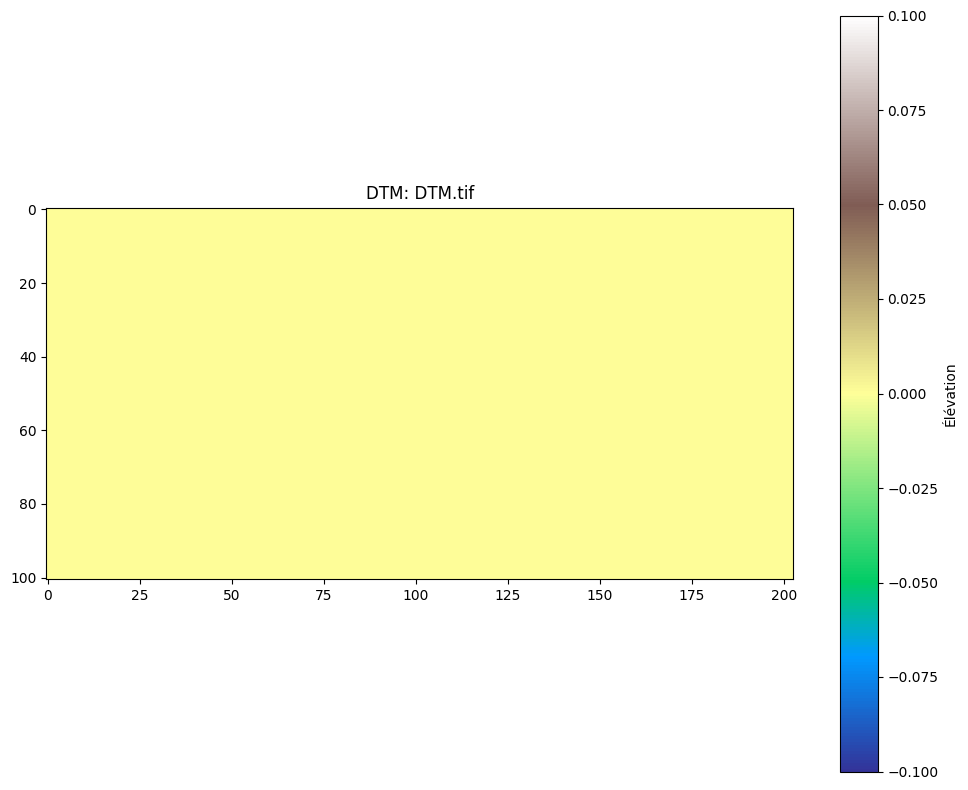


Visualisation de l'image SWIR...


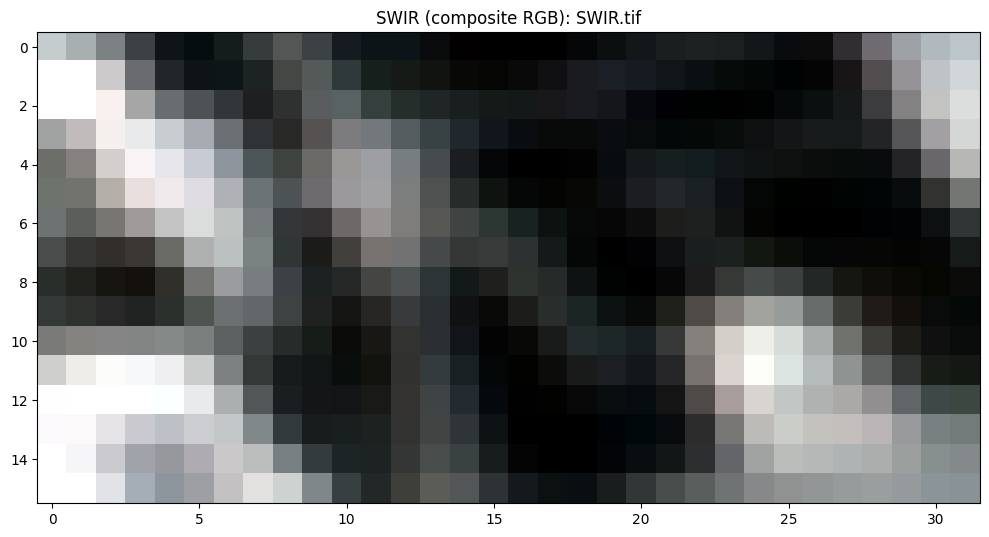


Visualisation de l'image SAR...


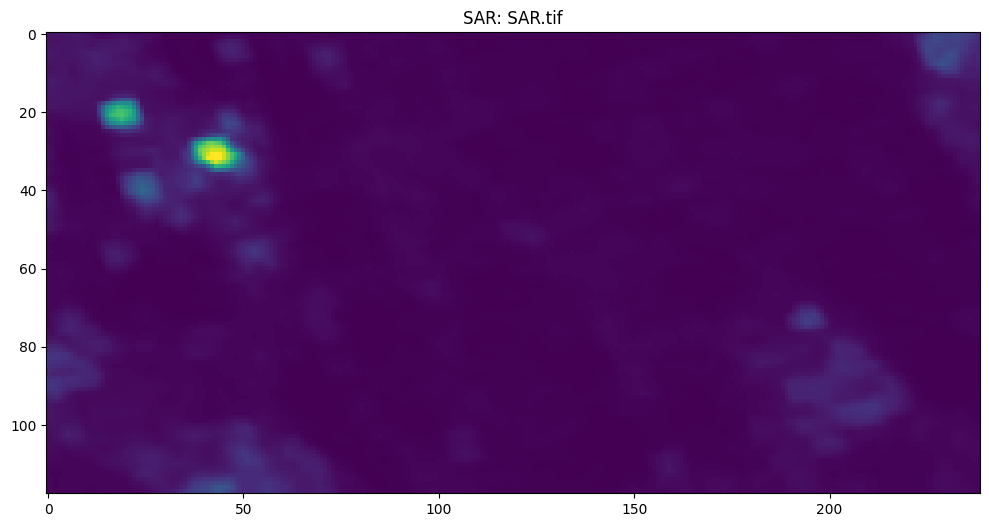


Visualisation de l'image PAN...


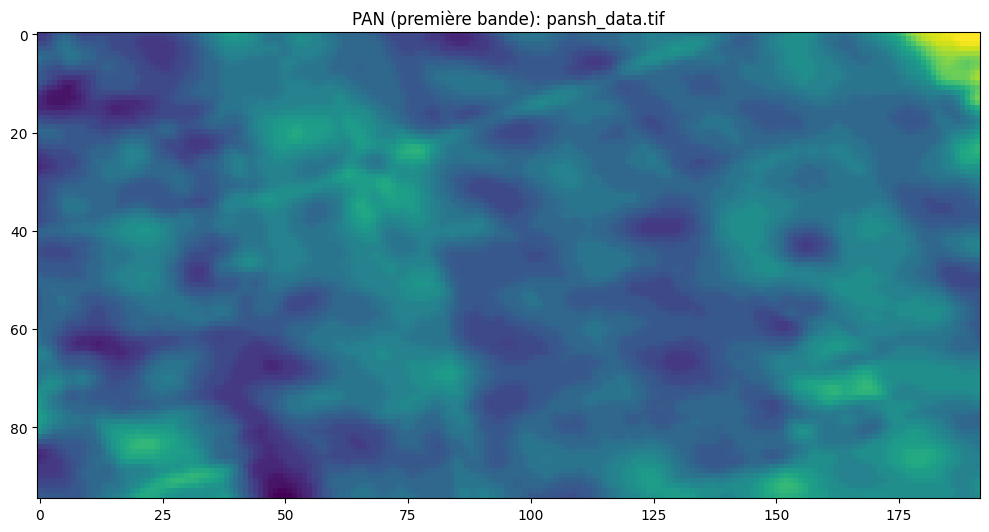


Visualisation de l'image VNIR...


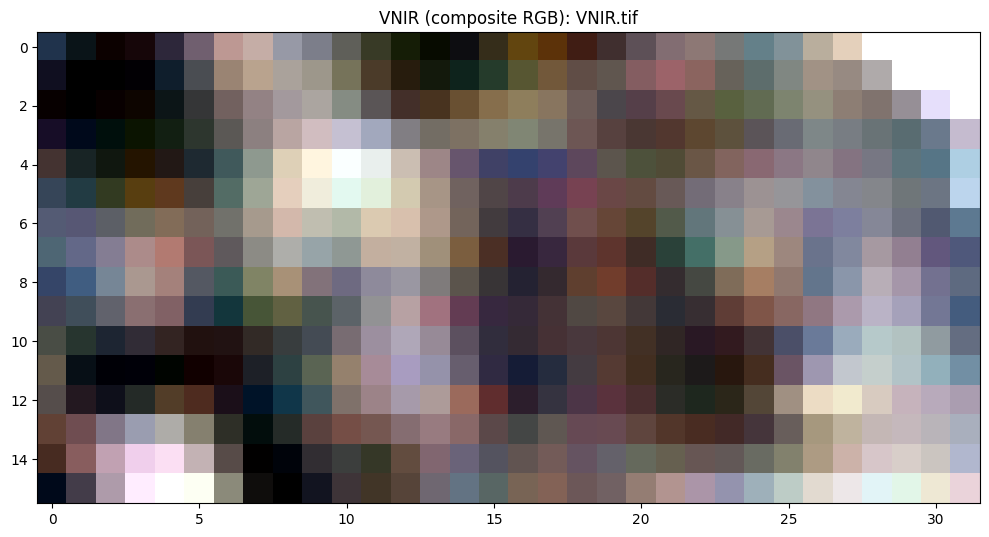


Visualisation de l'image NDVI...


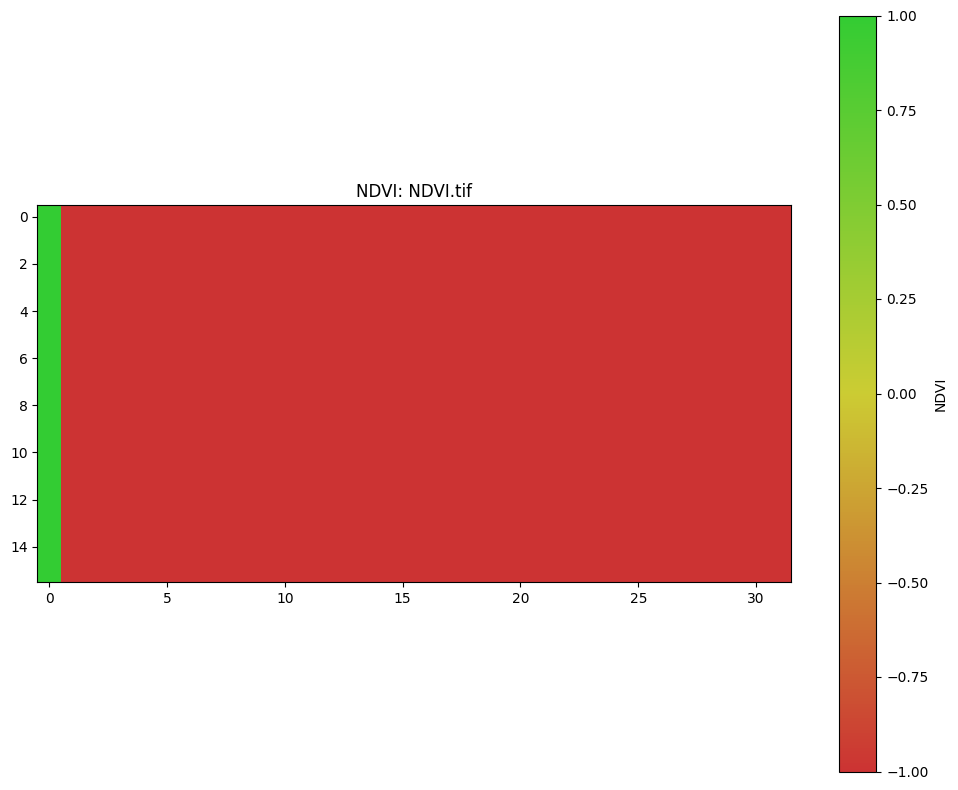


Visualisation de l'image RGB...


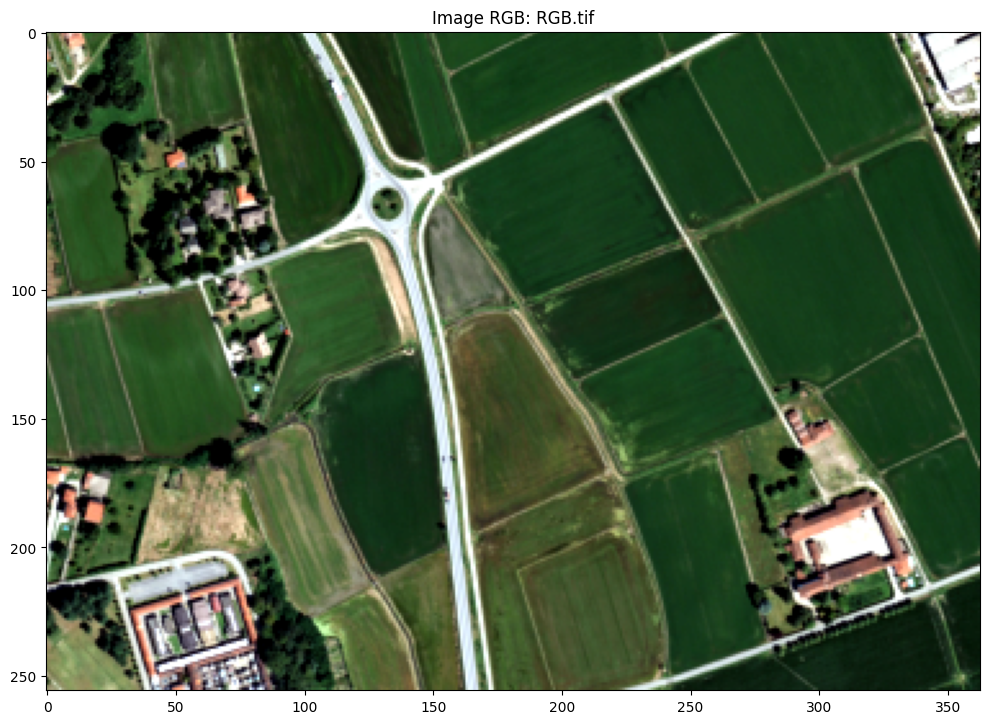


Calcul des statistiques des bandes...
     Type  Filename  Band        Min         Max       Mean        Std  \
0     DTM   DTM.tif     1   0.000000    0.000000   0.000000   0.000000   
1    SWIR  SWIR.tif     1   0.000059    0.282956   0.073517   0.070452   
2    SWIR  SWIR.tif     2   0.000194    0.307438   0.084608   0.076237   
3    SWIR  SWIR.tif     3   0.000654    0.323116   0.090796   0.080305   
4    SWIR  SWIR.tif     4   0.003403    0.349746   0.102837   0.086835   
..    ...       ...   ...        ...         ...        ...        ...   
418  VNIR  VNIR.tif    63   0.013500    0.383609   0.119768   0.092910   
419  NDVI  NDVI.tif     1  -0.999468    1.000000  -0.936115   0.347737   
420   RGB   RGB.tif     1  20.000000  217.000000  65.543313  33.033965   
421   RGB   RGB.tif     2  34.000000  218.000000  86.518003  23.983141   
422   RGB   RGB.tif     3  45.000000  215.000000  77.929300  22.773385   

        Median  NaN Count  
0     0.000000          0  
1     0.045428  

In [75]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import rasterio
from rasterio.plot import show
import pandas as pd
from glob import glob

# Classe pour gérer différents types d'images géospatiales
class GeoImageProcessor:
    def __init__(self, image_dir='Sorted_Sources/image_0'):
        """
        Initialise le processeur d'images géospatiales
        
        Args:
            image_dir (str): Répertoire contenant les images
        """
        self.image_dir = image_dir
        self.images = {}
        self.image_types = ['DTM', 'RGB', 'SWIR', 'NDVI', 'SAR', 'VNIR', 'PAN']
        
    def list_available_images(self):
        """Liste toutes les images TIF disponibles dans le répertoire"""
        if not os.path.exists(self.image_dir):
            print(f"Le répertoire {self.image_dir} n'existe pas.")
            return []
            
        image_files = glob(os.path.join(self.image_dir, "*.tif"))
        image_files.extend(glob(os.path.join(self.image_dir, "*.TIF")))
        
        if not image_files:
            print(f"Aucun fichier TIF trouvé dans {self.image_dir}")
        else:
            print(f"Fichiers trouvés : {len(image_files)}")
            for img in image_files:
                print(f" - {os.path.basename(img)}")
                
        return image_files
    
    def read_image(self, file_path):
        """
        Lit une image géospatiale avec rasterio
        
        Args:
            file_path (str): Chemin vers l'image
            
        Returns:
            tuple: (image_data, metadata)
        """
        try:
            with rasterio.open(file_path) as src:
                image_data = src.read()
                metadata = {
                    'height': src.height,
                    'width': src.width,
                    'count': src.count,
                    'crs': src.crs,
                    'transform': src.transform,
                    'dtype': src.dtypes[0]
                }
                return image_data, metadata
        except Exception as e:
            print(f"Erreur lors de la lecture de {file_path}: {e}")
            return None, None
    
    def load_all_images(self):
        """Charge toutes les images disponibles et les classe par type"""
        image_files = self.list_available_images()
        
        for img_file in image_files:
            img_name = os.path.basename(img_file).upper()
            
            # Détermine le type d'image basé sur le nom du fichier
            img_type = None
            for type_name in self.image_types:
                if type_name in img_name:
                    img_type = type_name
                    break
            
            if img_type is None:
                img_type = "AUTRE"
                
            # Lire l'image
            data, metadata = self.read_image(img_file)
            if data is not None:
                if img_type not in self.images:
                    self.images[img_type] = []
                
                self.images[img_type].append({
                    'filename': img_file,
                    'data': data,
                    'metadata': metadata
                })
                print(f"Image chargée: {img_name} (Type: {img_type})")
    
    def get_image_by_type(self, img_type):
        """
        Récupère une image par type
        
        Args:
            img_type (str): Type d'image (DTM, RGB, etc.)
            
        Returns:
            dict: Informations sur l'image ou None
        """
        img_type = img_type.upper()
        if img_type in self.images and len(self.images[img_type]) > 0:
            return self.images[img_type][0]
        return None
    
    def visualize_image(self, img_type):
        """
        Visualise une image selon son type
        
        Args:
            img_type (str): Type d'image à visualiser
        """
        img_info = self.get_image_by_type(img_type)
        if img_info is None:
            print(f"Aucune image de type {img_type} disponible")
            return
            
        data = img_info['data']
        filename = img_info['filename']
        
        plt.figure(figsize=(10, 8))
        
        # Différentes visualisations selon le type d'image
        if img_type == "RGB":
            # Pour une image RGB à 3 bandes
            if data.shape[0] >= 3:
                # Normalisation des données pour l'affichage
                rgb = np.zeros((data.shape[1], data.shape[2], 3), dtype=np.float32)
                for i in range(3):
                    band = data[i].astype(np.float32)
                    min_val = np.percentile(band, 2)
                    max_val = np.percentile(band, 98)
                    rgb[:,:,i] = np.clip((band - min_val) / (max_val - min_val), 0, 1)
                
                plt.imshow(rgb)
                plt.title(f"Image RGB: {os.path.basename(filename)}")
            else:
                plt.imshow(data[0], cmap='gray')
                plt.title(f"Image à bande unique (devrait être RGB): {os.path.basename(filename)}")
        
        elif img_type == "DTM":
            # Pour un modèle numérique de terrain
            plt.imshow(data[0], cmap='terrain')
            plt.colorbar(label='Élévation')
            plt.title(f"DTM: {os.path.basename(filename)}")
            
        elif img_type == "NDVI":
            # Pour un index de végétation
            # Créer une colormap personnalisée pour NDVI
            colors = [(0.8, 0.2, 0.2), (0.8, 0.8, 0.2), (0.2, 0.8, 0.2)]  # Rouge -> Jaune -> Vert
            ndvi_cmap = LinearSegmentedColormap.from_list('ndvi_cmap', colors, N=256)
            
            plt.imshow(data[0], cmap=ndvi_cmap, vmin=-1, vmax=1)
            plt.colorbar(label='NDVI')
            plt.title(f"NDVI: {os.path.basename(filename)}")
            
        elif img_type in ["SWIR", "SAR", "VNIR"]:
            # Pour les images multi-spectrales
            band_count = data.shape[0]
            
            if band_count == 1:
                plt.imshow(data[0], cmap='gray')
                plt.title(f"{img_type} (1 bande): {os.path.basename(filename)}")
            elif band_count >= 3:
                # Utiliser les 3 premières bandes pour un composite RGB
                rgb = np.zeros((data.shape[1], data.shape[2], 3), dtype=np.float32)
                for i in range(3):
                    if i < band_count:
                        band = data[i].astype(np.float32)
                        min_val = np.percentile(band, 2)
                        max_val = np.percentile(band, 98)
                        rgb[:,:,i] = np.clip((band - min_val) / (max_val - min_val), 0, 1)
                
                plt.imshow(rgb)
                plt.title(f"{img_type} (composite RGB): {os.path.basename(filename)}")
            else:
                plt.imshow(data[0], cmap='viridis')
                plt.title(f"{img_type}: {os.path.basename(filename)}")
            
        else:
            # Affichage générique pour les autres types
            if data.shape[0] == 1:
                plt.imshow(data[0], cmap='viridis')
                plt.title(f"{img_type}: {os.path.basename(filename)}")
            else:
                plt.imshow(data[0], cmap='viridis')
                plt.title(f"{img_type} (première bande): {os.path.basename(filename)}")
        
        plt.tight_layout()
        plt.show()
    
    def extract_band_statistics(self, img_type=None):
        """
        Extrait des statistiques pour chaque bande d'image
        
        Args:
            img_type (str, optional): Type d'image spécifique, ou None pour toutes
            
        Returns:
            pd.DataFrame: Statistiques des bandes
        """
        stats_records = []
        
        image_types_to_process = [img_type.upper()] if img_type else self.images.keys()
        
        for img_type in image_types_to_process:
            if img_type not in self.images:
                continue
                
            for img_idx, img_info in enumerate(self.images[img_type]):
                data = img_info['data']
                filename = os.path.basename(img_info['filename'])
                
                for band_idx in range(data.shape[0]):
                    band_data = data[band_idx]
                    
                    # Calculer les statistiques
                    stats = {
                        'Type': img_type,
                        'Filename': filename,
                        'Band': band_idx + 1,
                        'Min': np.nanmin(band_data),
                        'Max': np.nanmax(band_data),
                        'Mean': np.nanmean(band_data),
                        'Std': np.nanstd(band_data),
                        'Median': np.nanmedian(band_data),
                        'NaN Count': np.isnan(band_data).sum()
                    }
                    stats_records.append(stats)
        
        if stats_records:
            return pd.DataFrame(stats_records)
        return pd.DataFrame()

# Exemple d'utilisation
def main():
    # Créer une instance du processeur d'images
    processor = GeoImageProcessor()
    
    # Lister toutes les images disponibles
    print("Recherche des images dans le répertoire...")
    processor.list_available_images()
    
    # Charger toutes les images
    print("\nChargement des images...")
    processor.load_all_images()
    
    # Afficher quels types d'images ont été chargés
    print("\nTypes d'images chargés:")
    for img_type, images in processor.images.items():
        print(f"{img_type}: {len(images)} image(s)")
    
    # Exemple de visualisation des différents types d'images
    for img_type in processor.images.keys():
        if processor.get_image_by_type(img_type):
            print(f"\nVisualisation de l'image {img_type}...")
            processor.visualize_image(img_type)
    
    # Extraction des statistiques
    print("\nCalcul des statistiques des bandes...")
    stats_df = processor.extract_band_statistics()
    if not stats_df.empty:
        print(stats_df)
    else:
        print("Aucune statistique disponible.")

if __name__ == "__main__":
    main()

In [ ]:
import os
import shutil

# Définir les chemins
ndvi_folder = "/mnt/hdd1/ndvi/'"
destination_root = "Sorted_Sources"

# Parcourir les fichiers NDVI
for filename in os.listdir(ndvi_folder):
    if filename.endswith(".tif"):
        # Extraire le numéro de l'image
        image_numero = filename.split(".")[0]  # Supprime l'extension

        # Créer le chemin du dossier cible
        destination_folder = os.path.join(destination_root, f"image_{image_numero}")

        # Vérifier et créer le dossier s'il n'existe pas
        os.makedirs(destination_folder, exist_ok=True)

        # Déplacer le fichier
        shutil.move(os.path.join(ndvi_folder, filename), os.path.join(destination_folder, "ndvi.tif"))

print("Tri terminé !")


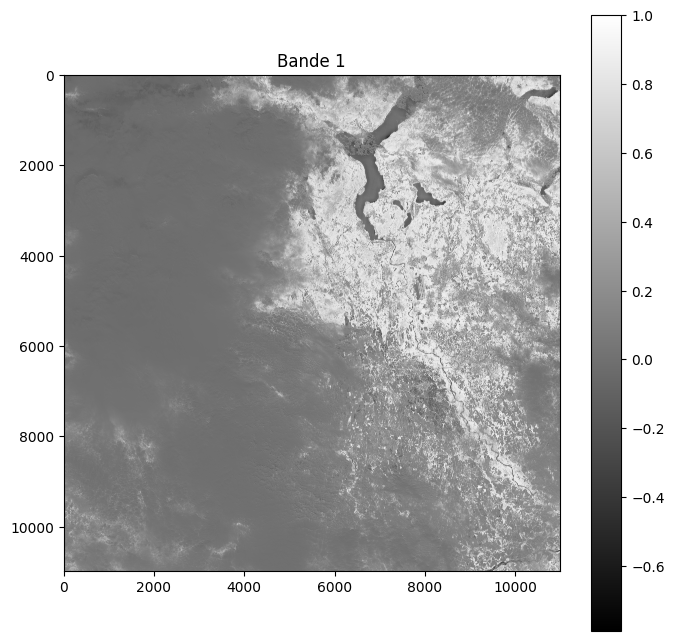

In [15]:
import rasterio
import matplotlib.pyplot as plt

file_path1 = "/home/adrien/Downloads/S2B_MSIL2A_20200429T102559_N0500_R108_T32TMR_20230502T003252_resampled.tif"
file_path2="/home/adrien/Downloads/subset_S2B_MSIL2A_20200426T101549_N0500_R065_T32TMR_20230522T160416_resampled.tif"
file_path3="/home/adrien/Downloads/image_fusionnee.tif"
# Ouvrir le fichier
with rasterio.open(file_path2) as src:
    for i in range(1, src.count + 1):  # Parcourir les bandes
        img = src.read(i)

        img = np.clip(img, -1, 1)
        plt.figure(figsize=(8, 8))
        plt.imshow(img, cmap='gray')  # Change "gray" en autre palette si nécessaire
        plt.title(f"Bande {i}")
        plt.colorbar()
        plt.show()


Min RED: 0.0, Max RED: 18304.0
Min NIR: 0.0, Max NIR: 17376.0
Min NDVI: -1.0, Max NDVI: 1.0


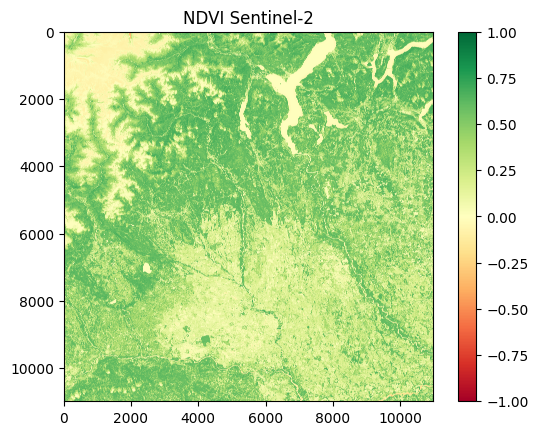

In [ ]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

# Définir les chemins des fichiers des bandes Rouge et NIR
red_band_path = "/home/adrien/Downloads/2S2A_MSIL2A_20200521T102031_N0500_R065_T32TMR_20230503T231339.SAFE/GRANULE/L2A_T32TMR_A025659_20200521T102644/IMG_DATA/R10m/T32TMR_20200521T102031_B04_10m.jp2"   # Bande rouge
nir_band_path = "/home/adrien/Downloads/2S2A_MSIL2A_20200521T102031_N0500_R065_T32TMR_20230503T231339.SAFE/GRANULE/L2A_T32TMR_A025659_20200521T102644/IMG_DATA/R10m/T32TMR_20200521T102031_B08_10m.jp2"   # Bande NIR
output_path = "/home/adrien/Downloads/ndvi/ndvi_2.tif"

# Charger les bandes
with rasterio.open(red_band_path) as red, rasterio.open(nir_band_path) as nir:
    red_band = red.read(1).astype(np.float32)
    nir_band = nir.read(1).astype(np.float32)
    meta = red.meta  # Récupérer les métadonnées



print(f"Min RED: {red_band.min()}, Max RED: {red_band.max()}")
print(f"Min NIR: {nir_band.min()}, Max NIR: {nir_band.max()}")
# Calculer le NDVI
ndvi = (nir_band - red_band) / (nir_band + red_band)
ndvi = np.clip(ndvi, -1, 1)  # S'assurer que les valeurs sont entre -1 et 1
print(f"Min NDVI: {ndvi.min()}, Max NDVI: {ndvi.max()}")
# Mettre à jour les métadonnées pour `float32`
meta.update({"dtype": "float32", "count": 1, "driver": "GTiff"})

# Sauvegarder en `.TIF`
with rasterio.open(output_path, "w", **meta) as dst:
    dst.write(ndvi, 1)

# Affichage du NDVI
plt.imshow(ndvi, cmap="RdYlGn")
plt.colorbar()
plt.title("NDVI Sentinel-2")
plt.show()


Min RED: 0.0, Max RED: 18144.0
Min NIR: 0.0, Max NIR: 17282.0
Min NDVI: -1.0, Max NDVI: 1.0


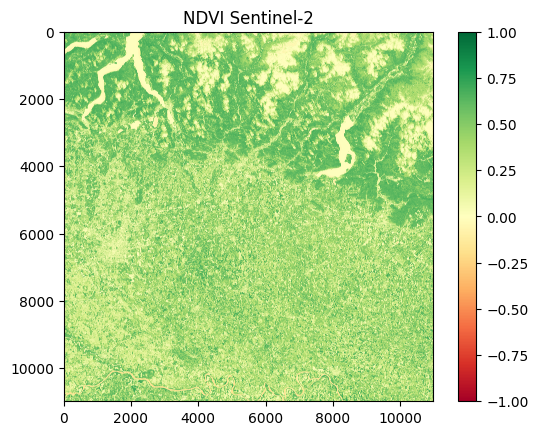

In [ ]:

# Définir les chemins des fichiers des bandes Rouge et NIR
red_band_path = "/home/adrien/Downloads/1S2A_MSIL2A_20200521T102031_N0500_R065_T32TNR_20230503T231339.SAFE/GRANULE/L2A_T32TNR_A025659_20200521T102644/IMG_DATA/R10m/T32TNR_20200521T102031_B04_10m.jp2"   # Bande rouge
nir_band_path = "/home/adrien/Downloads/1S2A_MSIL2A_20200521T102031_N0500_R065_T32TNR_20230503T231339.SAFE/GRANULE/L2A_T32TNR_A025659_20200521T102644/IMG_DATA/R10m/T32TNR_20200521T102031_B08_10m.jp2"   # Bande NIR
output_path = "/home/adrien/Downloads/ndvi/ndvi_1.tif"

# Charger les bandes
with rasterio.open(red_band_path) as red, rasterio.open(nir_band_path) as nir:
    red_band = red.read(1).astype(np.float32)
    nir_band = nir.read(1).astype(np.float32)
    meta = red.meta  # Récupérer les métadonnées



print(f"Min RED: {red_band.min()}, Max RED: {red_band.max()}")
print(f"Min NIR: {nir_band.min()}, Max NIR: {nir_band.max()}")
# Calculer le NDVI
ndvi = (nir_band - red_band) / (nir_band + red_band)
ndvi = np.clip(ndvi, -1, 1)  # S'assurer que les valeurs sont entre -1 et 1
print(f"Min NDVI: {ndvi.min()}, Max NDVI: {ndvi.max()}")
# Mettre à jour les métadonnées pour `float32`
meta.update({"dtype": "float32", "count": 1, "driver": "GTiff"})

# Sauvegarder en `.TIF`
with rasterio.open(output_path, "w", **meta) as dst:
    dst.write(ndvi, 1)

# Affichage du NDVI
plt.imshow(ndvi, cmap="RdYlGn")
plt.colorbar()
plt.title("NDVI Sentinel-2")
plt.show()


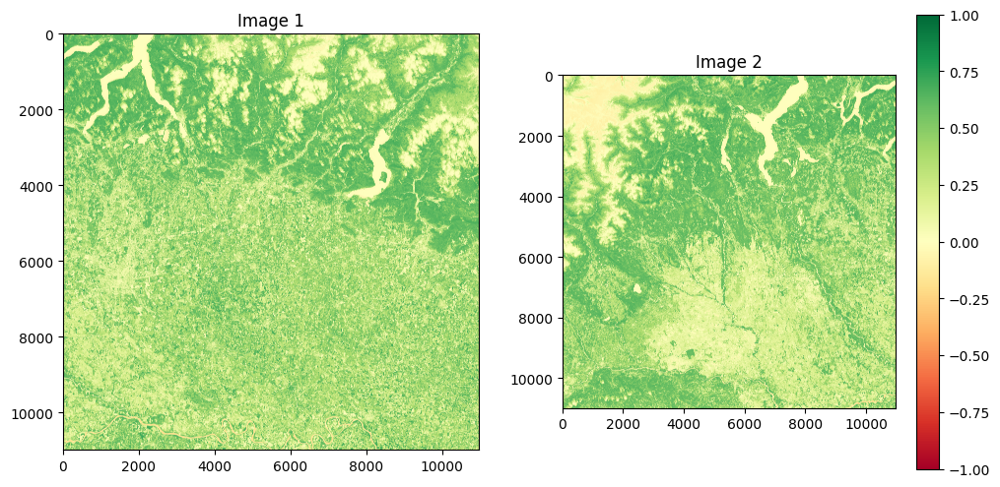

IndexError: index 1 is out of bounds for axis 0 with size 1

In [1]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from rasterio.merge import merge
import gc

# 🖼️ Définir les chemins des fichiers
image1_path = "/home/adrien/Downloads/ndvi/ndvi_1.tif"
image2_path = "/home/adrien/Downloads/ndvi/ndvi_2.tif"
output_path = "/home/adrien/Downloads/ndvi/ndvi_tot.tif"

# 🔄 Étape 1 : Charger et afficher les images séparément
with rasterio.open(image1_path) as img1, rasterio.open(image2_path) as img2:
    data1 = img1.read(1).astype(np.float32)
    data2 = img2.read(1).astype(np.float32)

fig, axs = plt.subplots(1, 2, figsize=(12, 6))
axs[0].imshow(data1, cmap="RdYlGn")
axs[0].set_title("Image 1")
axs[1].imshow(data2, cmap="RdYlGn")
axs[1].set_title("Image 2")
plt.colorbar(axs[1].imshow(data2, cmap="RdYlGn"))
plt.show()

# 🚀 Étape 2 : Fusionner les images par blocs
block_size = 1024  # Taille du bloc (plus petit pour limiter la mémoire)

# Ouvrir les images sans tout charger d'un coup
with rasterio.open(image1_path) as img1, rasterio.open(image2_path) as img2:
    datasets = [img1, img2]
    fusion, transform = merge(datasets)

    meta = img1.meta.copy()
    meta.update({
        "height": fusion.shape[1],
        "width": fusion.shape[2],
        "transform": transform
    })

# 🔄 Étape 3 : Fusion progressive avec la moyenne des valeurs
fusion_finale = np.zeros_like(fusion[0])  # Créer une image vide

for i in range(0, fusion.shape[1], block_size):  # Parcourir par blocs
    for j in range(0, fusion.shape[2], block_size):
        # Sélectionner le bloc actuel
        block = fusion[:, i:i + block_size, j:j + block_size]

        # Appliquer la fusion (moyenne des valeurs de recouvrement)
        fusion_finale[i:i + block_size, j:j + block_size] = np.where(
            (block[0] != 0) & (block[1] != 0),
            (block[0] + block[1]) / 2,
            np.where(block[0] != 0, block[0], block[1])
        )

        # Libérer la mémoire après chaque bloc
        gc.collect()

# 🏆 Étape 4 : Enregistrer l’image fusionnée
meta.update({"dtype": "float32", "count": 1})

with rasterio.open(output_path, "w", **meta) as dst:
    dst.write(fusion_finale, 1)

# 📌 Étape 5 : Afficher l'image fusionnée
plt.imshow(fusion_finale, cmap="RdYlGn")
plt.colorbar()
plt.title("Image fusionnée avec moyenne et gestion mémoire")
plt.show()

print("Fusion terminée et optimisée sans crash ! 🚀")


In [ ]:
# Charger les images
image1_path = "/home/adrien/Downloads/ndvi/ndvi_1.tif"
image2_path = "/home/adrien/Downloads/ndvi/ndvi_2.tif"
output_path = "/home/adrien/Downloads/ndvi/ndvi_tot.tif"


with rasterio.open(output_path) as img1:
        data1 = img1.read(1).astype(np.float32)
        plt.imshow(data1, cmap="RdYlGn")
        
        plt.colorbar()

plt.show()


📊 Visualisation des images d'entrée...


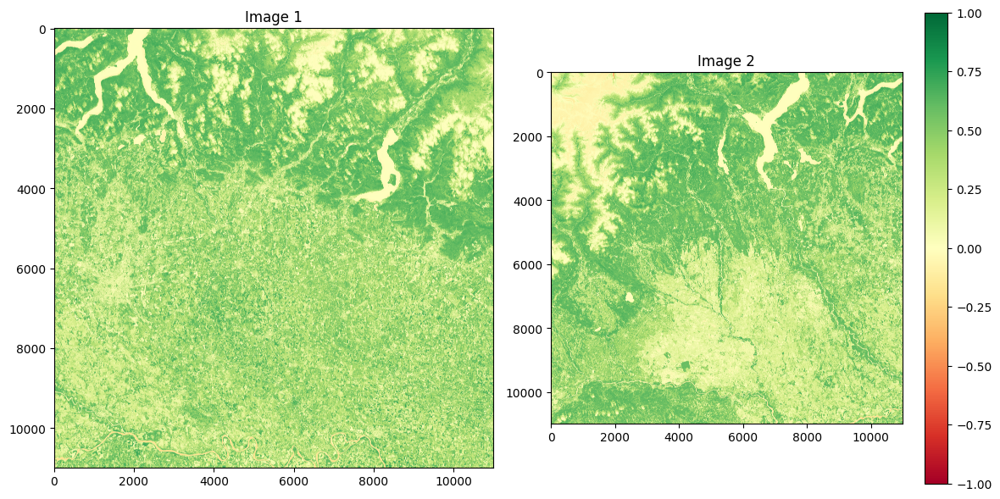

🔄 Fusion des images en cours...
Traitement du bloc 231/231...
✅ Fusion de 2 images terminée!
💾 Enregistrement de l'image fusionnée dans /home/adrien/Downloads/ndvi/ndvi_tot.tif...
📊 Visualisation du résultat...


In [ ]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from rasterio.merge import merge
import gc
import os

def visualize_rasters(image_paths, cmap="RdYlGn", figsize=(12, 6)):
    """
    Visualise les images raster individuelles
    
    Args:
        image_paths: Liste des chemins vers les images raster
        cmap: Colormap à utiliser pour la visualisation
        figsize: Taille de la figure
    """
    n_images = len(image_paths)
    fig, axs = plt.subplots(1, n_images, figsize=figsize)
    
    # Ajuster pour le cas d'une seule image
    if n_images == 1:
        axs = [axs]
    
    for i, path in enumerate(image_paths):
        with rasterio.open(path) as img:
            data = img.read(1).astype(np.float32)
            im = axs[i].imshow(data, cmap=cmap)
            axs[i].set_title(f"Image {i+1}")
            
    plt.colorbar(im, ax=axs[-1])
    plt.tight_layout()
    plt.show()

def merge_rasters(image_paths, output_path, block_size=1024, method='average', overlap_source=None):
    """
    Fusionne plusieurs images raster avec gestion de la mémoire par blocs
    
    Args:
        image_paths: Liste des chemins vers les images raster à fusionner
        output_path: Chemin pour sauvegarder l'image fusionnée
        block_size: Taille des blocs pour le traitement progressif
        method: Méthode de fusion ('average', 'max', 'min', 'priority')
        overlap_source: Pour la méthode 'priority', indice de l'image à utiliser 
                       dans les zones de recouvrement (0 pour la première image, 
                       1 pour la deuxième, etc.)
    """
    print("🔄 Fusion des images en cours...")
    
    # Ouvrir les images en mode lecture seule
    datasets = [rasterio.open(path) for path in image_paths]
    
    # Fusion initiale avec rasterio.merge
    fusion, transform = merge(datasets)
    
    # Récupérer les métadonnées de la première image
    meta = datasets[0].meta.copy()
    meta.update({
        "height": fusion.shape[1],
        "width": fusion.shape[2],
        "transform": transform,
        "dtype": "float32",
        "count": 1
    })
    
    # Créer une image vide pour la fusion finale
    fusion_finale = np.zeros_like(fusion[0])
    
    # Nombre total de blocs à traiter
    total_blocks = ((fusion.shape[1] + block_size - 1) // block_size) * ((fusion.shape[2] + block_size - 1) // block_size)
    block_count = 0
    
    # Fusion progressive par blocs
    for i in range(0, fusion.shape[1], block_size):
        for j in range(0, fusion.shape[2], block_size):
            block_count += 1
            print(f"Traitement du bloc {block_count}/{total_blocks}...", end="\r")
            
            # Définir les limites du bloc courant
            i_end = min(i + block_size, fusion.shape[1])
            j_end = min(j + block_size, fusion.shape[2])
            
            # Sélectionner le bloc actuel
            block = fusion[:, i:i_end, j:j_end]
            
            # Appliquer la méthode de fusion appropriée
            if method == 'average':
                # Moyenne des valeurs non nulles
                mask = np.sum(block != 0, axis=0) > 0
                if np.any(mask):
                    sum_values = np.sum(block, axis=0)
                    count_values = np.sum(block != 0, axis=0)
                    # Éviter division par zéro
                    count_values[count_values == 0] = 1
                    fusion_finale[i:i_end, j:j_end] = np.where(mask, sum_values / count_values, 0)
            elif method == 'max':
                fusion_finale[i:i_end, j:j_end] = np.max(block, axis=0)
            elif method == 'min':
                # Prendre le minimum des valeurs non nulles
                mask = np.sum(block != 0, axis=0) > 0
                if np.any(mask):
                    min_values = np.min(np.where(block != 0, block, np.inf), axis=0)
                    fusion_finale[i:i_end, j:j_end] = np.where(mask & (min_values != np.inf), min_values, 0)
            elif method == 'priority':
                # Utiliser les valeurs de l'image prioritaire pour les zones de recouvrement
                if overlap_source is None:
                    overlap_source = 0  # Par défaut, utiliser la première image
                
                # Vérifier que l'indice est valide
                if overlap_source >= block.shape[0]:
                    print(f"⚠️ Avertissement: Indice {overlap_source} hors limites, utilisation de l'image 0 par défaut")
                    overlap_source = 0
                
                # Créer un masque pour chaque image
                masks = [block[i] != 0 for i in range(block.shape[0])]
                overlap_mask = np.ones_like(masks[0], dtype=bool)
                for mask in masks:
                    overlap_mask = overlap_mask & mask
                
                # Prendre les valeurs de l'image prioritaire pour les zones de recouvrement
                result_block = np.zeros_like(block[0])
                
                # D'abord, remplir avec les valeurs de l'image prioritaire
                result_block = np.where(masks[overlap_source], block[overlap_source], result_block)
                
                # Ensuite, pour les zones non couvertes par l'image prioritaire,
                # prendre les valeurs des autres images dans l'ordre
                for i in range(block.shape[0]):
                    if i != overlap_source:
                        result_block = np.where(
                            (result_block == 0) & masks[i],
                            block[i],
                            result_block
                        )
                
                fusion_finale[i:i_end, j:j_end] = result_block
            
            # Libérer la mémoire après chaque bloc
            gc.collect()
    
    print(f"\n✅ Fusion de {len(image_paths)} images terminée!")
    
    # Enregistrer l'image fusionnée
    print(f"💾 Enregistrement de l'image fusionnée dans {output_path}...")
    #ajout de la méthode dans le nom du fichier
    output_path=f"{os.path.splitext(output_path)[0]}_{method}{'_priority' if method == 'priority' else ''}.tif"
    with rasterio.open(output_path, "w", **meta) as dst:
        dst.write(fusion_finale.astype(np.float32), 1)
    
    # Fermer les datasets ouverts
    for ds in datasets:
        ds.close()
    
    return fusion_finale

def visualize_result(data, cmap="RdYlGn", title="Image fusionnée"):
    """
    Visualise le résultat de la fusion
    
    Args:
        data: Données raster à visualiser
        cmap: Colormap à utiliser
        title: Titre de la figure
    """
    plt.figure(figsize=(10, 8))
    im = plt.imshow(data, cmap=cmap)
    plt.colorbar(im)
    plt.title(title)
    plt.tight_layout()
    plt.show()

def main():
    """Fonction principale"""
    # Définir les chemins des fichiers
    image1_path = "/home/adrien/Downloads/ndvi/ndvi_1.tif"
    image2_path = "/home/adrien/Downloads/ndvi/ndvi_2.tif"
    output_path = "/home/adrien/Downloads/ndvi/ndvi_tot.tif"
    
    # Vérifier que les fichiers source existent
    for path in [image1_path, image2_path]:
        if not os.path.exists(path):
            print(f"⚠️ Erreur: Le fichier {path} n'existe pas!")
            return
    
    # Créer le dossier de sortie si nécessaire
    output_dir = os.path.dirname(output_path)
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Visualiser les images d'entrée
    print("📊 Visualisation des images d'entrée...")
    visualize_rasters([image1_path, image2_path])
    
    # Fusionner les images
    result = merge_rasters(
        [image1_path, image2_path],
        output_path,
        block_size=1024,
        method='average'  # Options: 'average', 'max', 'min', 'priority'
        # Pour utiliser la méthode priority, décommentez la ligne suivante:
        # method='priority', overlap_source=0  # 0 pour l'image 1, 1 pour l'image 2
    )
    
    # Visualiser le résultat
    print("📊 Visualisation du résultat...")
    # visualize_result(result, title="Image NDVI fusionnée avec moyenne et gestion mémoire")
    
    print("🎉 Traitement terminé avec succès!")

if __name__ == "__main__":
    main()

In [4]:
# Chemin de l'image
image_path = "/home/adrien/Downloads/ndvi/ndvi_1.tif"

# Ouvrir le fichier en mode lecture sans le charger
with rasterio.open(image_path) as img:
    largeur = img.width  # Nombre de colonnes (pixels en largeur)
    hauteur = img.height  # Nombre de lignes (pixels en hauteur)
    crs = img.crs  # Système de coordonnées
    transform = img.transform  # Transformation géospatiale

print(f"Dimensions de l'image : {largeur} x {hauteur}")
print(f"Système de coordonnées : {crs}")
print(f"Transformation : {transform}")

Dimensions de l'image : 10980 x 10980
Système de coordonnées : EPSG:32632
Transformation : | 10.00, 0.00, 499980.00|
| 0.00,-10.00, 5100000.00|
| 0.00, 0.00, 1.00|


In [16]:
import scipy.io
from osgeo import gdal, osr

In [17]:
def extract_corners(data):
    """
    Extrait les coordonnées des coins d'une image géoréférencée.
    
    Parameters:
    -----------
    data : gdal.Dataset
        Jeu de données GDAL contenant les informations géospatiales.
    
    Returns:
    --------
    tuple
        (minx, miny, maxx, maxy) Les coordonnées des coins de l'image.
    """
    width = data.RasterXSize
    height = data.RasterYSize
    gt = data.GetGeoTransform()
    
    # Calcul des coordonnées des quatre coins
    minx = gt[0]
    maxy = gt[3]
    maxx = gt[0] + width*gt[1] + height*gt[2]
    miny = gt[3] + width*gt[4] + height*gt[5]
    
    return minx, miny, maxx, maxy

In [18]:
def extract_tiles(output_data, input_data, coordinate_path):
    """
    Extrait des tuiles d'une image en utilisant des coordonnées définies.
    
    Parameters:
    -----------
    output_data : str
        Chemin du dossier pour les nouvelles tuiles.
    input_data : str
        Chemin de l'image à diviser en tuiles.
    coordinate_path : str ou gdal.Dataset
        Chemin des données contenant les coordonnées (matrice lat_lon ou images RGB).
    """
    # Extraction des coordonnées selon le type de fichier
    if isinstance(coordinate_path, str):
        if coordinate_path.endswith('.mat'):  # extraction des bbox à partir du fichier mat
            coord = scipy.io.loadmat(coordinate_path)['im_lat_lon']
            coord_y = coord.shape[1]
            lat = coord[:, np.arange(0, coord_y, 2)]
            lon = coord[:, np.arange(1, coord_y, 2)]
            current_lat_min = np.min(lat)
            current_lon_min = np.min(lon)
            current_lat_max = np.max(lat)
            current_lon_max = np.max(lon)
        elif coordinate_path.endswith('.tif'):  # extraction des bbox à partir du fichier tif
            coord = gdal.Open(coordinate_path, gdal.GA_ReadOnly)
            current_lon_min, current_lat_min, current_lon_max, current_lat_max = extract_corners(coord)
        else:
            raise TypeError("coordinate_path doit se terminer par '.mat' ou '.tif'")
    elif isinstance(coordinate_path, gdal.Dataset):  # gestion de l'objet Dataset
        current_lon_min, current_lat_min, current_lon_max, current_lat_max = extract_corners(coordinate_path)
    else:
        raise TypeError("coordinate_path doit être une chaîne de caractères ou un objet gdal.Dataset")
    
    # Définition de la boîte englobante
    bbox = (current_lon_min, current_lat_max, current_lon_max, current_lat_min)
    
    # Options de translation (commentées, mais disponibles si nécessaire)
    # translate_options = gdal.TranslateOptions(
    #     creationOptions = ['COMPRESS=LZW']
    # )
    
    # Création de la tuile
    gdal.Translate(output_data, input_data, projWin=bbox)  # options=translate_options si décommenté

In [26]:
import os
import rasterio
from rasterio.windows import from_bounds
from rasterio.enums import Resampling

# === PARAMÈTRES ===
path_source = '/home/adrien/Downloads/ndvi/ndvi_tot_avg.tif'  # <-- Remplace avec ton chemin source (NDVI)
source_folder = 'Sorted_Sources/'
output_folder = 'ndvi_tiles'

os.makedirs(output_folder, exist_ok=True)

# === CHARGER L'IMAGE SOURCE ===
with rasterio.open(path_source) as src_ndvi:
    ndvi_crs = src_ndvi.crs

    # === LISTER LES SOUS-DOSSIERS AVEC LES FICHIERS pansh.tif ===
    for folder in os.listdir(source_folder):
        folder_path = os.path.join(source_folder, folder)
        pansh_path = os.path.join(folder_path, 'pansh_data.tif')

        if not os.path.isfile(pansh_path):
            continue

        # === OUVRIR L'IMAGE DE RÉFÉRENCE ===
        with rasterio.open(pansh_path) as ref:
            if ref.crs != ndvi_crs:
                raise ValueError(f"CRS mismatch: {ref.crs} != {ndvi_crs}")

            bounds = ref.bounds  # coordonnées spatiales de l'image de référence

            # === DÉTERMINER LA FENÊTRE DANS L'IMAGE SOURCE ===
            window = from_bounds(*bounds, transform=src_ndvi.transform)

            # === LIRE LES DONNÉES DANS LA FENÊTRE ===
            ndvi_tile = src_ndvi.read(window=window, out_shape=(src_ndvi.count,
                                                                int(window.height),
                                                                int(window.width)),
                                      resampling=Resampling.bilinear)

            # === METTRE À JOUR LA TRANSFORMATION ===
            transform = src_ndvi.window_transform(window)

            # === SAUVEGARDER LA TUILE DANS LE DOSSIER CIBLE ===
            output_path = os.path.join(output_folder, f"{folder}.tif")
            profile = src_ndvi.profile
            profile.update({
                'height': ndvi_tile.shape[1],
                'width': ndvi_tile.shape[2],
                'transform': transform
            })

            with rasterio.open(output_path, 'w', **profile) as dst:
                dst.write(ndvi_tile)

print("✅ Découpage terminé.")

ValueError: CRS mismatch: EPSG:4326 != EPSG:32632

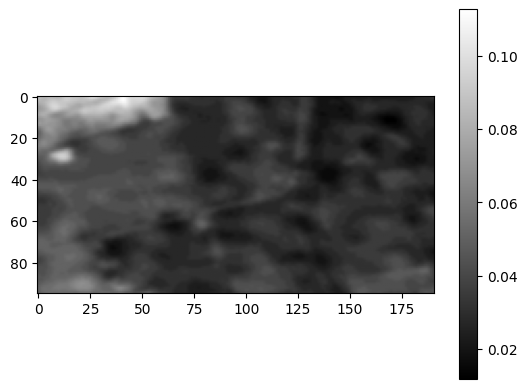

In [22]:

with rasterio.open("/home/adrien/Downloads/ndvi_tiles/ndvi_image_2.tif") as src:
    premiere_couche = src.read(1)  # Lecture de la bande 1

# Affichage
plt.imshow(premiere_couche, cmap="gray")
plt.colorbar()
plt.show()



In [24]:
for i in range(1808):
    # Ouvrir l'image source
    with rasterio.open(f"/home/adrien/Downloads/ndvi_tiles/ndvi_image_{i}.tif") as src:
        profil = src.profile  # Copie du profil original
        premiere_couche = src.read(1)  # Lecture de la bande 1

    # Modifier le profil pour n'avoir qu'une seule couche
    profil.update(count=1)

    # Enregistrer l'image filtrée
    with rasterio.open(f"/home/adrien/Downloads/ndvi_tiles/ndvi_image_{i}.tif", "w", **profil) as dst:
        dst.write(premiere_couche, 1)

Min: 0.01787753403186798, Max: 0.08947392553091049


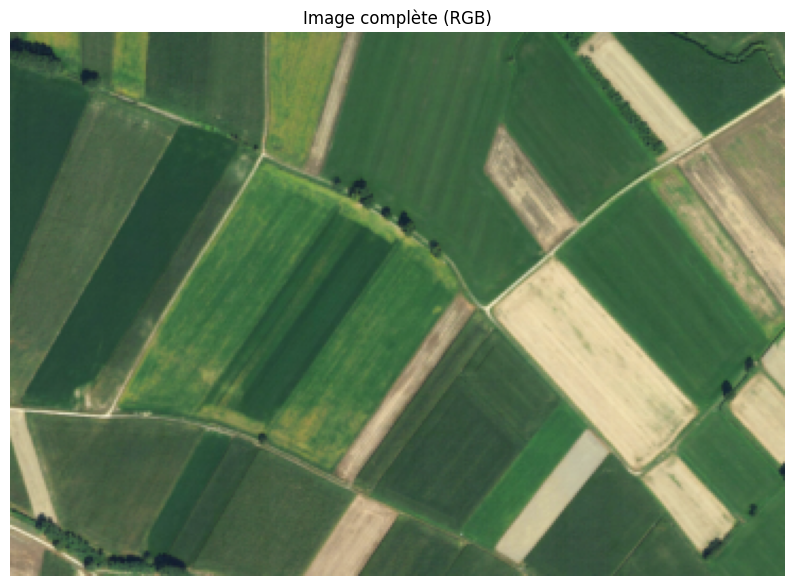

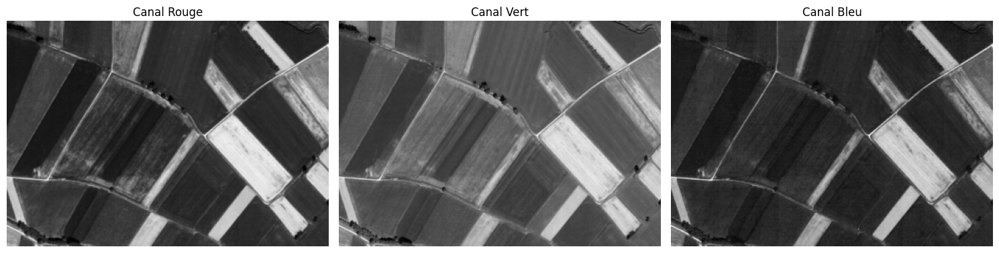

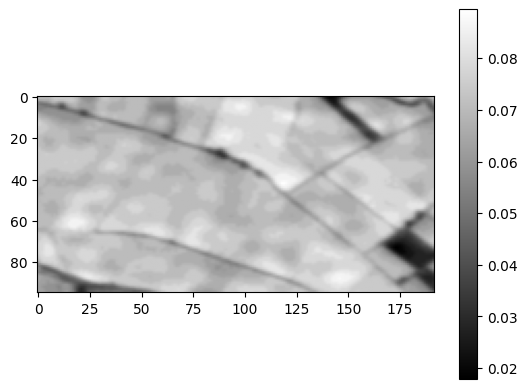

In [44]:
nb=1790
with rasterio.open(f"/home/adrien/Downloads/ndvi_tiles/ndvi_image_{nb}.tif") as src:
    premiere_couche = src.read(1)  # Lecture de la bande 1
    # Vérification des valeurs min/max
print(f"Min: {np.min(premiere_couche)}, Max: {np.max(premiere_couche)}")
with rasterio.open(f"Sorted_Sources/image_{nb}/RGB.tif") as src:
    image_data = src.read()  # Read all bands
    metadata = src.meta  #
plot_rgb(image_data)
# Affichage
plt.imshow(premiere_couche, cmap="gray")
plt.colorbar()
plt.show()

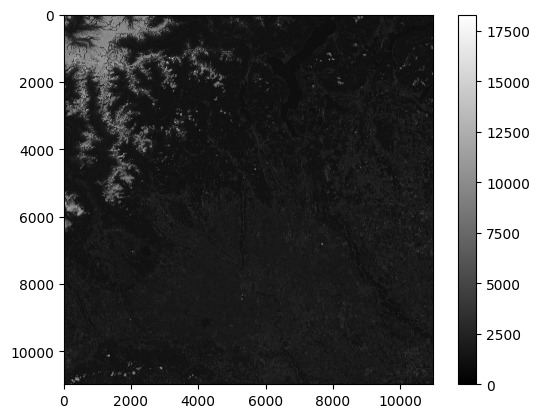

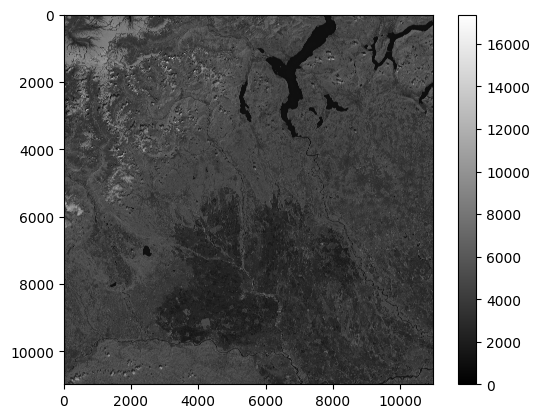

In [3]:
with rasterio.open(f"/home/adrien/Downloads/2S2A_MSIL2A_20200521T102031_N0500_R065_T32TMR_20230503T231339.SAFE/GRANULE/L2A_T32TMR_A025659_20200521T102644/IMG_DATA/R10m/T32TMR_20200521T102031_B04_10m.jp2") as src:
    red = src.read(1)  # Lecture de la bande 1
    # Affichage
plt.imshow(red, cmap="gray")
plt.colorbar()
plt.show()
with rasterio.open(f"/home/adrien/Downloads/2S2A_MSIL2A_20200521T102031_N0500_R065_T32TMR_20230503T231339.SAFE/GRANULE/L2A_T32TMR_A025659_20200521T102644/IMG_DATA/R10m/T32TMR_20200521T102031_B08_10m.jp2") as src:
    nir = src.read(1)  # Read all bands
    metadata = src.meta  #
plt.imshow(nir, cmap="gray")
plt.colorbar()
plt.show()


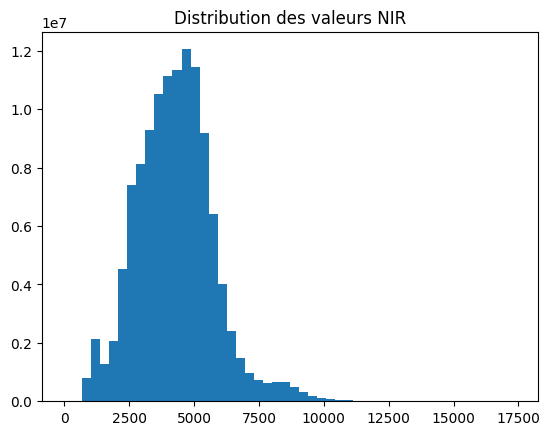

In [7]:
plt.hist(nir.ravel(), bins=50)
plt.title("Distribution des valeurs NIR")
plt.show()



début du calcul du ndvi
# Affichage du NDVI


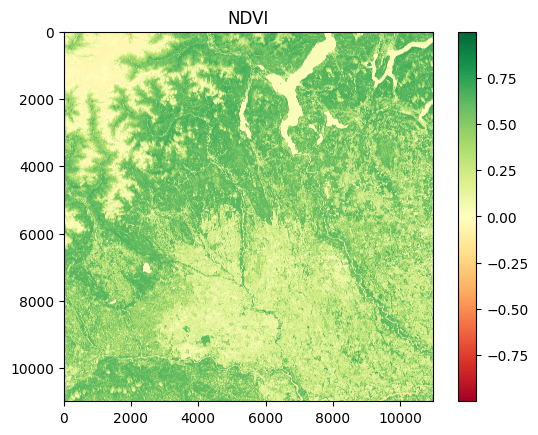

In [8]:
# Normalizing NIR and Red bands to the range [0, 1]
nir = nir.astype(np.float32) / np.max(nir)
red = red.astype(np.float32) / np.max(red)

print('début du calcul du ndvi')
ndvi=(nir-red)/(nir+red+1e-6)
print('# Affichage du NDVI')
plt.imshow(ndvi, cmap="RdYlGn")
plt.colorbar()
plt.title("NDVI")   
plt.show()


In [9]:
import os
import shutil

# Chemin du dossier contenant les fichiers NDVI
source_folder = "/home/adrien/Downloads/ndvi_tiles (Copy)/"

# Chemin du dossier de destination
destination_root = "Sorted_Sources"

# Vérifier et créer le dossier de destination s'il n'existe pas
if not os.path.exists(destination_root):
    os.makedirs(destination_root)

## Parcourir les fichiers dans le dossier source
for file_name in os.listdir(source_folder):
    if file_name.endswith(".tif"):
        # Extraire le numéro du fichier
        num = file_name.split("_")[2].split(".")[0]  # Ajustez selon votre nommage de fichier
        destination_folder = os.path.join(destination_root, f"image_{num}/")
        
        # Vérifier et créer le dossier de destination
        if not os.path.exists(destination_folder):
            os.makedirs(destination_folder)
        
        # Nouveau nom du fichier
        new_file_name = "ndvi.tif"
        new_file_path = os.path.join(destination_folder, new_file_name)
        
        print('file name:',file_name)
        print('destination folder',destination_folder)
        print('new file name',new_file_name)
        # Déplacer et renommer le fichier
        shutil.move(os.path.join(source_folder, file_name), new_file_path)

print("Tri et renommage des fichiers terminés.")

file name: ndvi_image_736.tif
destination folder Sorted_Sources/image_736/
new file name ndvi.tif
file name: ndvi_image_966.tif
destination folder Sorted_Sources/image_966/
new file name ndvi.tif
file name: ndvi_image_1356.tif
destination folder Sorted_Sources/image_1356/
new file name ndvi.tif
file name: ndvi_image_476.tif
destination folder Sorted_Sources/image_476/
new file name ndvi.tif
file name: ndvi_image_913.tif
destination folder Sorted_Sources/image_913/
new file name ndvi.tif
file name: ndvi_image_1352.tif
destination folder Sorted_Sources/image_1352/
new file name ndvi.tif
file name: ndvi_image_390.tif
destination folder Sorted_Sources/image_390/
new file name ndvi.tif
file name: ndvi_image_187.tif
destination folder Sorted_Sources/image_187/
new file name ndvi.tif
file name: ndvi_image_1105.tif
destination folder Sorted_Sources/image_1105/
new file name ndvi.tif
file name: ndvi_image_1455.tif
destination folder Sorted_Sources/image_1455/
new file name ndvi.tif
file name: n

file name: ndvi_image_1805.tif
destination folder Sorted_Sources/image_1805/
new file name ndvi.tif
file name: ndvi_image_1382.tif
destination folder Sorted_Sources/image_1382/
new file name ndvi.tif
file name: ndvi_image_795.tif
destination folder Sorted_Sources/image_795/
new file name ndvi.tif
file name: ndvi_image_902.tif
destination folder Sorted_Sources/image_902/
new file name ndvi.tif
file name: ndvi_image_1381.tif
destination folder Sorted_Sources/image_1381/
new file name ndvi.tif
file name: ndvi_image_113.tif
destination folder Sorted_Sources/image_113/
new file name ndvi.tif
file name: ndvi_image_1234.tif
destination folder Sorted_Sources/image_1234/
new file name ndvi.tif
file name: ndvi_image_283.tif
destination folder Sorted_Sources/image_283/
new file name ndvi.tif
file name: ndvi_image_349.tif
destination folder Sorted_Sources/image_349/
new file name ndvi.tif
file name: ndvi_image_1001.tif
destination folder Sorted_Sources/image_1001/
new file name ndvi.tif
file name:

In [11]:
import os

# Chemin du dossier de destination
destination_root = "Sorted_Sources"

# Parcourir les sous-dossiers
for folder_name in os.listdir(destination_root):
    folder_path = os.path.join(destination_root, folder_name)
    
    if os.path.isdir(folder_path):  # Vérifier que c'est un dossier
        for file_name in os.listdir(folder_path):
            file_path = os.path.join(folder_path, file_name)
            
            # Supprimer les fichiers NDVI qui ne sont pas "ndvi.tif"
            if file_name.startswith("NDVI") and file_name != "ndvi.tif":
                print(f"Supprimé : {file_path}")
                os.remove(file_path)
                print(f"Supprimé : {file_path}")

print("Nettoyage terminé !")

Supprimé : Sorted_Sources/image_1274/NDVI.tif
Supprimé : Sorted_Sources/image_1274/NDVI.tif
Supprimé : Sorted_Sources/image_1559/NDVI.tif
Supprimé : Sorted_Sources/image_1559/NDVI.tif
Supprimé : Sorted_Sources/image_711/NDVI.tif
Supprimé : Sorted_Sources/image_711/NDVI.tif
Supprimé : Sorted_Sources/image_163/NDVI.tif
Supprimé : Sorted_Sources/image_163/NDVI.tif
Supprimé : Sorted_Sources/image_321/NDVI.tif
Supprimé : Sorted_Sources/image_321/NDVI.tif
Supprimé : Sorted_Sources/image_421/NDVI.tif
Supprimé : Sorted_Sources/image_421/NDVI.tif
Supprimé : Sorted_Sources/image_1074/NDVI.tif
Supprimé : Sorted_Sources/image_1074/NDVI.tif
Supprimé : Sorted_Sources/image_1383/NDVI.tif
Supprimé : Sorted_Sources/image_1383/NDVI.tif
Supprimé : Sorted_Sources/image_1324/NDVI.tif
Supprimé : Sorted_Sources/image_1324/NDVI.tif
Supprimé : Sorted_Sources/image_1372/NDVI.tif
Supprimé : Sorted_Sources/image_1372/NDVI.tif
Supprimé : Sorted_Sources/image_532/NDVI.tif
Supprimé : Sorted_Sources/image_532/NDVI.ti

# Verification de NewDataset

In [3]:
import json
import NewArchitectures
import NewDataset
import NewBase
import importlib

with open('params.json') as f:
    conf = json.load(f)


309


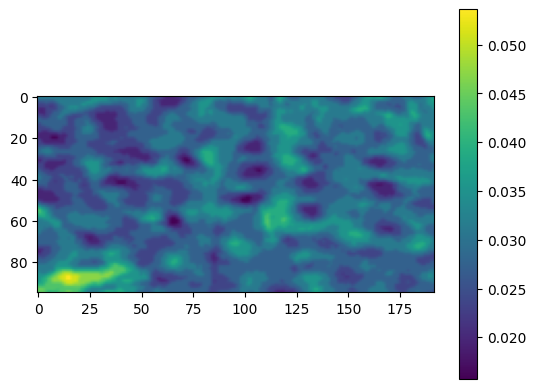

In [17]:
print(len(dataset))
tif=dataset.read_tif('Sorted_Sources/image_4/ndvi.tif')
# Select the first band (or any specific band) for visualization
plt.imshow(tif, cmap='viridis')  # You can replace 'viridis' with any other colormap you prefer
plt.colorbar()
plt.show()

Traitement de l'image 1: Sorted_Sources/train/image_711/ndvi.tif
Traitement de l'image 2: Sorted_Sources/train/image_321/ndvi.tif
Traitement de l'image 3: Sorted_Sources/train/image_421/ndvi.tif
Traitement de l'image 4: Sorted_Sources/train/image_1074/ndvi.tif
Traitement de l'image 5: Sorted_Sources/train/image_1383/ndvi.tif
Traitement de l'image 6: Sorted_Sources/train/image_1324/ndvi.tif
Traitement de l'image 7: Sorted_Sources/train/image_1372/ndvi.tif
Traitement de l'image 8: Sorted_Sources/train/image_532/ndvi.tif
Traitement de l'image 9: Sorted_Sources/train/image_390/ndvi.tif
Traitement de l'image 10: Sorted_Sources/train/image_1037/ndvi.tif
Traitement de l'image 11: Sorted_Sources/train/image_466/ndvi.tif
Traitement de l'image 12: Sorted_Sources/train/image_430/ndvi.tif
Traitement de l'image 13: Sorted_Sources/train/image_829/ndvi.tif
Traitement de l'image 14: Sorted_Sources/train/image_943/ndvi.tif
Traitement de l'image 15: Sorted_Sources/train/image_1345/ndvi.tif
Traitement de

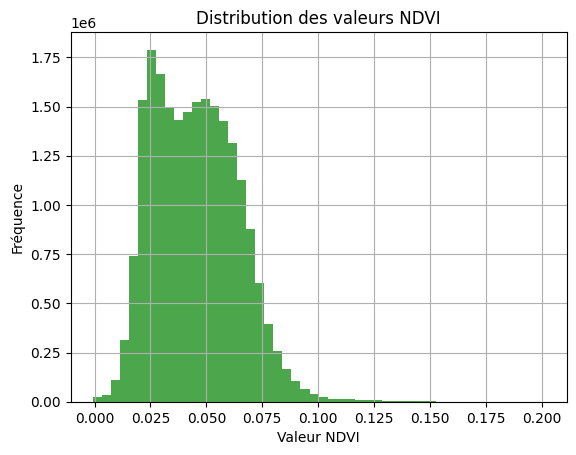

In [4]:
import os
import rasterio
import numpy as np
import matplotlib.pyplot as plt

# Chemin du dossier principal contenant les sous-dossiers image_numéro
chemin_principal = 'Sorted_Sources/train'

# Liste pour stocker les valeurs NDVI
toutes_les_valeurs_ndvi = []
compteur=0
# Parcourir récursivement les sous-dossiers
for racine, dossiers, fichiers in os.walk(chemin_principal):
	for dossier in dossiers:

		if dossier.startswith('image_'):
			dossier_images = os.path.join(racine, dossier)
			# Parcourir chaque fichier dans le sous-dossier
			for nom_fichier in os.listdir(dossier_images):
				if nom_fichier.endswith('ndvi.tif'):
					chemin_fichier = os.path.join(dossier_images, nom_fichier)
                    
					# Ouvrir l'image avec rasterio
					with rasterio.open(chemin_fichier) as src:
						# Lire les bandes rouge et proche infrarouge (adaptez les indices selon vos images)
						ndvi = src.read(1).astype('float32')

						# Ajouter les valeurs NDVI à la liste
						toutes_les_valeurs_ndvi.extend(ndvi[~np.isnan(ndvi)])
					compteur+=1
					print(f"Traitement de l'image {compteur}: {chemin_fichier}")
# Afficher la distribution des valeurs NDVI
plt.hist(toutes_les_valeurs_ndvi, bins=50, color='green', alpha=0.7)
plt.title('Distribution des valeurs NDVI')
plt.xlabel('Valeur NDVI')
plt.ylabel('Fréquence')
plt.grid(True)
plt.show()


# Verification NewBase

In [54]:
import json
import torch
import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping, RichProgressBar
from pytorch_lightning.callbacks import LearningRateMonitor
from pytorch_lightning.loggers import TensorBoardLogger


import importlib
# Importez votre classe Base et Dataset
from NewBase import Base
from NewDataset import path_sources
import NewArchitectures,Dataset
importlib.reload(NewArchitectures)



<module 'NewArchitectures' from '/home/adrien/Documents/Internship 3A polytechnique/Forecasting-DL-sent2-time-series/NewArchitectures.py'>

In [12]:
with open('params.json') as f:
    conf = json.load(f)
with open('path.json') as f:
    path = json.load(f)

base=Base(conf)

In [13]:
model=NewArchitectures.NewArchitectures(conf)

In [18]:
# 5. Définissez les callbacks
callbacks = [
    RichProgressBar(),
    ModelCheckpoint(
        monitor='total',
        mode='min',
        save_top_k=1,
        save_last=True,
        filename='l1_loss-{epoch:02d}-{total:.4f}'
    ),
    LearningRateMonitor(logging_interval='epoch'),
    EarlyStopping(
        monitor='total',
        min_delta=0.00,
        patience=4,
        verbose=True,
        mode='min',
        strict=True,
    )
]

# 6. Créez le Trainer
# trainer = pl.Trainer(
#     accelerator='gpu',
#     devices=1,
#     max_epochs=conf['n_epochs'],
#     num_sanity_val_steps=2,
#     logger=TensorBoardLogger('checkpoints', name=conf['experiment_name']),
#     callbacks=callbacks
# )

# Mode debug sans fast_dev_run
trainer = pl.Trainer(
    detect_anomaly=True,     # Détection d'anomalies PyTorch
    accelerator='gpu',      # Utiliser le GPU
    log_every_n_steps=1,     # Logger à chaque étape
    enable_model_summary=True,  # Afficher un résumé du modèle
    max_epochs=2             # Limiter le nombre d'époques
)
# trainer = pl.Trainer(fast_dev_run=True)

You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
You have turned on `Trainer(detect_anomaly=True)`. This will significantly slow down compute speed and is recommended only for model debugging.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


In [20]:
# 7. Lancez l'entraînement
trainer.fit(model)



LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type             | Params | Mode 
----------------------------------------------------------
0 | metrics      | MetricCollection | 0      | train
1 | metrics_test | MetricCollection | 0      | train
2 | net          | Unet             | 25.2 M | train
----------------------------------------------------------
25.2 M    Trainable params
0         Non-trainable params
25.2 M    Total params
100.775   Total estimated model params size (MB)
119       Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

In [47]:
import os
import shutil

# Définir les chemins
test_set_file = "Sources/List/train_set.txt"
source_folder = "Sorted_Sources"
destination_folder = "Sorted_Sources/train"

# Lire les numéros de fichier depuis test_set.txt
with open(test_set_file, "r") as f:
    file_numbers = {line.strip() for line in f}  # Stocker les numéros sans espace supplémentaire

# Parcourir les dossiers et déplacer les correspondants
for folder in os.listdir(source_folder):
    folder_path = os.path.join(source_folder, folder)
    if os.path.isdir(folder_path):  # Vérifier que c'est bien un dossier
        folder_number = folder.split("_")[-1]  # Extraire le numéro du dossier
        
        if folder_number in file_numbers:
            shutil.move(folder_path, os.path.join(destination_folder, folder))
            print(f"Déplacé : {folder}")


print("Déplacement terminé !")

Déplacé : image_711
Déplacé : image_321
Déplacé : image_421
Déplacé : image_1074
Déplacé : image_1383
Déplacé : image_1324
Déplacé : image_1372
Déplacé : image_532
Déplacé : image_390
Déplacé : image_1037
Déplacé : image_466
Déplacé : image_430
Déplacé : image_829
Déplacé : image_943
Déplacé : image_1345
Déplacé : image_689
Déplacé : image_1005
Déplacé : image_523
Déplacé : image_144
Déplacé : image_723
Déplacé : image_1779
Déplacé : image_94
Déplacé : image_227
Déplacé : image_1483
Déplacé : image_692
Déplacé : image_330
Déplacé : image_892
Déplacé : image_786
Déplacé : image_351
Déplacé : image_220
Déplacé : image_1651
Déplacé : image_534
Déplacé : image_514
Déplacé : image_954
Déplacé : image_1785
Déplacé : image_1405
Déplacé : image_357
Déplacé : image_1325
Déplacé : image_758
Déplacé : image_1301
Déplacé : image_131
Déplacé : image_1425
Déplacé : image_124
Déplacé : image_1427
Déplacé : image_120
Déplacé : image_1541
Déplacé : image_776
Déplacé : image_612
Déplacé : image_1239
Dép

In [51]:
file_path = "Sources/List/test_set.txt"
with open(file_path, "r", encoding="utf-8") as f:
    num_lines = sum(1 for line in f)

print(f"Nombre de lignes : {num_lines}")


Nombre de lignes : 226


In [20]:
226+1051+225

1502

# Verification entrainement

In [10]:
import torch
from pytorch_lightning import LightningModule
from NewArchitectures import NewArchitectures  # Assurez-vous que votre classe modèle est bien importée
import json
import torch.utils.data as data
import matplotlib.pyplot as plt
import random
%matplotlib inline

import numpy as np
# with open('params.json') as f:
#     conf = json.load(f)




In [19]:

model = NewArchitectures.load_from_checkpoint("checkpoints/dem_sar/version_0/checkpoints/last.ckpt")
model.eval()

dl = model.test_dataloader()
device='cuda'
model.conf['sources']

['dem', 'sar']

In [3]:
def comparaison_prediction(batch):
    input,target,_=batch
    for i in range(len(input)):
        input[i]=input[i].to(device)
    target=target.to(device)
    y = model(input)
    y = y.cpu().detach().numpy()
    target = target.cpu().detach().numpy()

    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    erreur = np.abs(target[0, 0] - y[0, 0])

    im0 = axs[0].imshow(target[0, 0], cmap='viridis')  # Assuming input has shape (batch_size, channels, height, width)
    axs[0].set_title("Image cible")
    plt.colorbar(im0, ax=axs[0])

    im1 = axs[1].imshow(y[0, 0], cmap='viridis')  # Assuming y has shape (batch_size, channels, height, width)
    axs[1].set_title("Prédiction")
    plt.colorbar(im1, ax=axs[1])

    im2 = axs[2].imshow(erreur, cmap='viridis')
    axs[2].set_title("Erreur")
    plt.colorbar(im2, ax=axs[2])

    plt.show()
    print(np.mean(erreur))


In [20]:

# Get a random batch index
random_index = random.randint(0, len(dl) - 1)

# Fetch the random batch
batch = list(dl)[random_index]
comparaison_prediction(batch)


IndexError: Caught IndexError in DataLoader worker process 0.
Original Traceback (most recent call last):
  File "/home/adrien/Documents/Internship 3A polytechnique/Forecasting-DL-sent2-time-series/.venv/lib/python3.12/site-packages/torch/utils/data/_utils/worker.py", line 349, in _worker_loop
    data = fetcher.fetch(index)  # type: ignore[possibly-undefined]
           ^^^^^^^^^^^^^^^^^^^^
  File "/home/adrien/Documents/Internship 3A polytechnique/Forecasting-DL-sent2-time-series/.venv/lib/python3.12/site-packages/torch/utils/data/_utils/fetch.py", line 52, in fetch
    data = [self.dataset[idx] for idx in possibly_batched_index]
            ~~~~~~~~~~~~^^^^^
  File "/home/adrien/Documents/Internship 3A polytechnique/Forecasting-DL-sent2-time-series/NewDataset.py", line 90, in __getitem__
    trans_img= self.trans([*inputs,*targets])
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/adrien/Documents/Internship 3A polytechnique/Forecasting-DL-sent2-time-series/NewArchitectures.py", line 129, in transform_inputs
    inps_dict = {source: inps[i] for i, source in enumerate(self.conf['sources']+['ndvi'])}  # add ndvi to the inputs dict
                         ~~~~^^^
IndexError: list index out of range


Valeurs cibles minimales : 0.007989950478076935, Valeurs cibles maximales : 0.21960768103599548
Valeurs prédites minimales : 0.0, Valeurs prédites maximales : 1.0
Valeurs minimales : 2.421438694000244e-08, Valeurs maximales : 0.03954385966062546


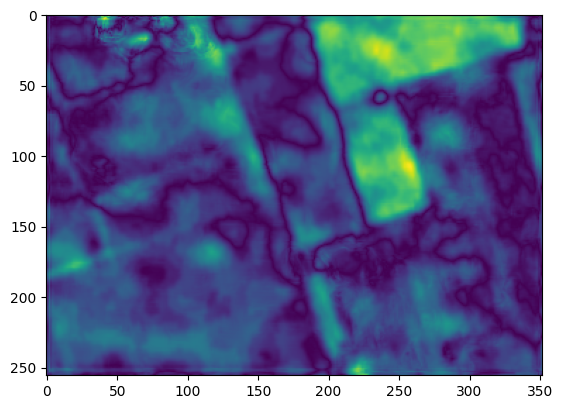

In [22]:
plt.imshow(erreur)
target_min = target.min()
target_max = target.max()
print(f"Valeurs cibles minimales : {target_min}, Valeurs cibles maximales : {target_max}")
print(f"Valeurs prédites minimales : {y.min()}, Valeurs prédites maximales : {y.max()}")


min_val = erreur.min()
max_val = erreur.max()
print(f"Valeurs minimales : {min_val}, Valeurs maximales : {max_val}")

In [18]:
dl.
# batch=list(dl)[0]

8

In [12]:
def analyze_pixel_distribution(dataloader):
    """
    Analyse la distribution des valeurs de pixels pour un DataLoader PyTorch.
    
    Args:
    dataloader (torch.utils.data.DataLoader): DataLoader contenant les images
    
    Returns:
    dict: Statistiques de distribution des pixels
    """
    # Liste pour stocker toutes les valeurs de pixels
    all_pixel_values = []
    
    # Désactiver le calcul des gradients pour l'efficacité
    with torch.no_grad():
        # Parcourir tous les batchs du DataLoader
        for batch in dataloader:
            # Supposant que le premier élément est le batch d'images
            # Si votre DataLoader retourne un tuple (images, labels), utilisez batch[0]
            inputs,target,_ = batch
            image=target
            # Vérifier si les images sont déjà un tenseur PyTorch
            if not isinstance(image, torch.Tensor):
                images = image[0]
            
            # S'assurer que les images sont en nuances de gris (1 canal)
            if image.dim() == 4 and image.shape[1] > 1:
                # Si images en RGB, convertir en nuances de gris
                image = image.mean(dim=1, keepdim=True)
            
            # Aplatir les images et convertir en numpy
            pixel_values = image.numpy().flatten()
            all_pixel_values.extend(pixel_values)
    
    # Convertir en tableau numpy
    pixel_values = np.array(all_pixel_values)
    
    # Calculer les statistiques
    stats = {
        'mean': float(np.mean(pixel_values)),
        'median': float(np.median(pixel_values)),
        'std_dev': float(np.std(pixel_values)),
        'min': float(np.min(pixel_values)),
        'max': float(np.max(pixel_values))
    }
    
    # Tracer l'histogramme
    plt.figure(figsize=(10, 6))
    plt.hist(pixel_values, bins=100, density=True, alpha=0.7, color='blue')
    plt.title('Distribution des valeurs de pixels')
    plt.xlabel('Valeur du pixel')
    plt.ylabel('Fréquence normalisée')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    plt.close()
    
    return stats

distribution_stats = analyze_pixel_distribution(dl)

# Afficher les statistiques
print("Statistiques de distribution des pixels :")
for key, value in distribution_stats.items():
    print(f"{key}: {value}")



IndexError: Caught IndexError in DataLoader worker process 0.
Original Traceback (most recent call last):
  File "/home/adrien/Documents/Internship 3A polytechnique/Forecasting-DL-sent2-time-series/.venv/lib/python3.12/site-packages/torch/utils/data/_utils/worker.py", line 349, in _worker_loop
    data = fetcher.fetch(index)  # type: ignore[possibly-undefined]
           ^^^^^^^^^^^^^^^^^^^^
  File "/home/adrien/Documents/Internship 3A polytechnique/Forecasting-DL-sent2-time-series/.venv/lib/python3.12/site-packages/torch/utils/data/_utils/fetch.py", line 52, in fetch
    data = [self.dataset[idx] for idx in possibly_batched_index]
            ~~~~~~~~~~~~^^^^^
  File "/home/adrien/Documents/Internship 3A polytechnique/Forecasting-DL-sent2-time-series/NewDataset.py", line 90, in __getitem__
    trans_img= self.trans([*inputs,*targets])
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/adrien/Documents/Internship 3A polytechnique/Forecasting-DL-sent2-time-series/NewArchitectures.py", line 129, in transform_inputs
    inps_dict = {source: inps[i] for i, source in enumerate(self.conf['sources']+['ndvi'])}  # add ndvi to the inputs dict
                         ~~~~^^^
IndexError: list index out of range
